In [ ]:
!pip install tensorflow opencv-python pydmd scikit-learn


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 148.9/148.9 kB 3.3 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip /content/drive/MyDrive/archive.zip -d /content/drive/MyDrive/Dataset

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_005.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_006.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_007.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_008.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_009.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_010.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_011.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_012.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_013.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BROWNSPOT4_014.jpg  
  inflating: /content/drive/MyDrive/Dataset/dataset_RTI/brown spot/BR

In [ ]:
!pip install pydmd

In [ ]:
tf.config.list_physical_devices('GPU')


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [ ]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from tqdm import tqdm


In [ ]:
# Define the path to the dataset
dataset_path = '/content/drive/MyDrive/Dataset/dataset_RTI'

# Verify that the dataset folder exists
os.listdir('/content/drive/MyDrive/Dataset/dataset_RTI')


['bacterial light',
 'blast',
 'brown spot',
 'healthy',
 'hispa',
 'tungro',
 'train',
 'validation',
 'test']

In [ ]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from tqdm import tqdm

# Define the path to the dataset directory
dataset_path = '/content/drive/MyDrive/Dataset/dataset_RTI'

# Define a dictionary to assign numerical labels to each class
label_dict = {
    'bacterial light': 0,
    'blast': 1,
    'brown spot': 2,
    'healthy': 3,
    'hispa': 4,
    'tungro': 5
}

# Function to load and preprocess images
def load_images_and_labels(directory, img_height=224, img_width=224):
    images = []
    labels = []
    for label_name, label in label_dict.items():
        folder_path = os.path.join(directory, label_name)
        if not os.path.exists(folder_path):
            print(f"Directory {folder_path} does not exist.")
            continue
        for image_name in tqdm(os.listdir(folder_path), desc=f"Loading {label_name} images"):
            image_path = os.path.join(folder_path, image_name)
            try:
                image = cv2.imread(image_path)
                if image is not None:
                    # Resize image to the target size
                    image = cv2.resize(image, (img_height, img_width))
                    # Normalize image to range [0, 1]
                    image = image / 255.0
                    images.append(image)
                    labels.append(label)
                else:
                    print(f"Warning: {image_path} is not a valid image.")
            except Exception as e:
                print(f"Error loading image {image_path}: {e}")
    return np.array(images), np.array(labels)

# Load images and labels
images, labels = load_images_and_labels(dataset_path)
print(f"Loaded {len(images)} images with labels")

Loading tungro images: 100%|██████████| 1388/1388 [00:16<00:00, 85.10it/s] 


Loaded 9607 images with labels


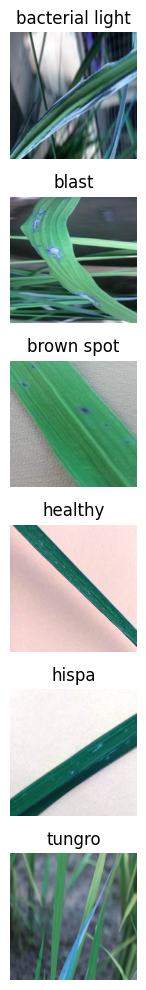

In [ ]:
import matplotlib.pyplot as plt
import random

# Display some sample images with labels from each class
def plot_sample_images(images, labels, label_dict, num_samples_per_class=1):
    plt.figure(figsize=(15, 10))
    class_indices = {label: np.where(labels == label)[0] for label in label_dict.values()}

    for i, (label_name, label) in enumerate(label_dict.items()):
        indices = class_indices[label]
        selected_indices = random.sample(list(indices), num_samples_per_class)

        for j, idx in enumerate(selected_indices):
            plt.subplot(len(label_dict), num_samples_per_class, i * num_samples_per_class + j + 1)
            plt.imshow(images[idx])
            plt.title(label_name)
            plt.axis('off')

    plt.tight_layout()
    plt.show()

# Plot sample images
plot_sample_images(images, labels, label_dict, num_samples_per_class=1)

In [ ]:
import os

# Specify the paths
main_dir = '/content/drive/MyDrive/Dataset/dataset_RTI'

# Specify the class names
classes = ['bacterial light', 'blast', 'brown spot', 'healthy', 'hispa', 'tungro']

# Function to count images in each class folder
def count_images_in_main_folder():
    for class_name in classes:
        class_folder = os.path.join(main_dir, class_name)
        if os.path.exists(class_folder):
            num_images = len(os.listdir(class_folder))
            print(f"{class_name}: {num_images} images")
        else:
            print(f"{class_name}: Folder does not exist")

# Verify the dataset structure
count_images_in_main_folder()

bacterial light: 1704 images
blast: 2299 images
brown spot: 2163 images
healthy: 1488 images
hispa: 565 images
tungro: 1388 images


In [ ]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Define the paths
base_dir = '/content/drive/MyDrive/Dataset/dataset_RTI'
splits = ['train', 'validation', 'test']
classes = ['bacterial light', 'blast', 'brown spot', 'healthy', 'hispa', 'tungro']

# Create the main directories
for split in splits:
    split_dir = os.path.join(base_dir, split)
    os.makedirs(split_dir, exist_ok=True)
    for cls in classes:
        os.makedirs(os.path.join(split_dir, cls), exist_ok=True)

# Define the number of images for each class
class_counts = {
    'bacterial light': 1704,
    'blast': 2299,
    'brown spot': 2163,
    'healthy': 1488,
    'hispa': 565,
    'tungro': 1388
}

# Function to split and move images
def split_and_move_images(class_name, count):
    if count == 0:
        return

    src_dir = os.path.join(base_dir, class_name)
    if not os.path.exists(src_dir):
        print(f"Directory {src_dir} does not exist.")
        return

    all_images = os.listdir(src_dir)

    train_images, temp_images = train_test_split(all_images, test_size=0.2, random_state=42)
    val_images, test_images = train_test_split(temp_images, test_size=0.5, random_state=42)

    for img in train_images:
        shutil.move(os.path.join(src_dir, img), os.path.join(base_dir, 'train', class_name, img))
    for img in val_images:
        shutil.move(os.path.join(src_dir, img), os.path.join(base_dir, 'validation', class_name, img))
    for img in test_images:
        shutil.move(os.path.join(src_dir, img), os.path.join(base_dir, 'test', class_name, img))

# Split and move images for each class
for cls, count in class_counts.items():
    split_and_move_images(cls, count)

# Verify the dataset structure
def verify_structure():
    for split in splits:
        split_dir = os.path.join(base_dir, split)
        for cls in classes:
            cls_dir = os.path.join(split_dir, cls)
            print(f"{split}/{cls}: {len(os.listdir(cls_dir))} images")

verify_structure()

train/bacterial light: 1363 images
train/blast: 1839 images
train/brown spot: 1730 images
train/healthy: 1190 images
train/hispa: 452 images
train/tungro: 1110 images
validation/bacterial light: 170 images
validation/blast: 230 images
validation/brown spot: 216 images
validation/healthy: 149 images
validation/hispa: 56 images
validation/tungro: 139 images
test/bacterial light: 171 images
test/blast: 230 images
test/brown spot: 217 images
test/healthy: 149 images
test/hispa: 57 images
test/tungro: 139 images


In [ ]:
from sklearn.model_selection import train_test_split

# Split the data into training (80%), validation (10%), and test (10%) sets
train_images, temp_images, train_labels, temp_labels = train_test_split(
    images, labels, test_size=0.2, random_state=42, stratify=labels)

val_images, test_images, val_labels, test_labels = train_test_split(
    temp_images, temp_labels, test_size=0.5, random_state=42, stratify=temp_labels)

print("Training set size:", len(train_images))
print("Validation set size:", len(val_images))
print("Test set size:", len(test_images))

Training set size: 7685
Validation set size: 961
Test set size: 961


In [ ]:
import tensorflow as tf

# Convert to TensorFlow Dataset
def convert_to_tf_dataset(images, labels, batch_size=32, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((images, labels))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(images))
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
    return dataset

# Convert training, validation, and test sets
train_dataset = convert_to_tf_dataset(train_images, train_labels)
val_dataset = convert_to_tf_dataset(val_images, val_labels, shuffle=False)
test_dataset = convert_to_tf_dataset(test_images, test_labels, shuffle=False)

print("Training dataset:", train_dataset)
print("Validation dataset:", val_dataset)
print("Test dataset:", test_dataset)

Training dataset: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float64, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
Validation dataset: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float64, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>
Test dataset: <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float64, name=None), TensorSpec(shape=(None,), dtype=tf.int64, name=None))>


In [ ]:
import os
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint

# Define paths and data generators
base_dir = '/content/drive/MyDrive/Dataset/dataset_RTI'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

img_height, img_width = 224, 224
batch_size = 32

train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, vertical_flip=True, rotation_range=20)
validation_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(train_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode='categorical')
validation_generator = validation_datagen.flow_from_directory(validation_dir, target_size=(img_height, img_width), batch_size=batch_size, class_mode='categorical')

# Define the model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(img_height, img_width, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(len(train_generator.class_indices), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

# Setup checkpoint callback
checkpoint_path = '/content/drive/MyDrive/Dataset/densenet121_rice_disease_checkpoint.weights.h5'
checkpoint_callback = ModelCheckpoint(
    checkpoint_path, save_weights_only=True, save_best_only=True, verbose=1
)

# Load checkpoint weights if they exist
if os.path.exists(checkpoint_path):
    model.load_weights(checkpoint_path)
    print("Checkpoint weights loaded successfully. Resuming training from the last saved epoch.")
else:
    print("No checkpoint found. Starting training from scratch.")

# Train the model
history = model.fit(
    train_generator,
    epochs=3,  # Set to 1 for testing, adjust as needed
    validation_data=validation_generator,
    callbacks=[checkpoint_callback]
)

# Save the model
model_save_path = '/content/drive/MyDrive/Dataset/densenet121_rice_disease.h5'
model.save(model_save_path)
print(f"Model saved to {model_save_path}")

Found 7684 images belonging to 6 classes.
Found 960 images belonging to 6 classes.
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 734 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Checkpoint weights loaded successfully. Resuming training from the last saved epoch.
Epoch 1/3


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


241/241 ━━━━━━━━━━━━━━━━━━━━ 0s 25s/step - accuracy: 0.9063 - loss: 0.2516 
Epoch 1: val_loss improved from inf to 0.23299, saving model to /content/drive/MyDrive/Dataset/densenet121_rice_disease_checkpoint.weights.h5
241/241 ━━━━━━━━━━━━━━━━━━━━ 6462s 26s/step - accuracy: 0.9063 - loss: 0.2516 - val_accuracy: 0.9115 - val_loss: 0.2330
Epoch 2/3
241/241 ━━━━━━━━━━━━━━━━━━━━ 0s 25s/step - accuracy: 0.9200 - loss: 0.2253 
Epoch 2: val_loss did not improve from 0.23299
241/241 ━━━━━━━━━━━━━━━━━━━━ 6161s 26s/step - accuracy: 0.9200 - loss: 0.2253 - val_accuracy: 0.9135 - val_loss: 0.2491
Epoch 3/3
241/241 ━━━━━━━━━━━━━━━━━━━━ 0s 24s/step - accuracy: 0.9332 - loss: 0.1964 
Epoch 3: val_loss improved from 0.23299 to 0.20887, saving model to /content/drive/MyDrive/Dataset/densenet121_rice_disease_checkpoint.weights.h5
241/241 ━━━━━━━━━━━━━━━━━━━━ 6107s 25s/step - accuracy: 0.9332 - loss: 0.1964 - val_accuracy: 0.9250 - val_loss: 0.2089


Model saved to /content/drive/MyDrive/Dataset/densenet121_rice_disease.h5


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/bacterial light/BACTERAILBLIGHT3_030.jpg: bacterial light with probability 0.8423
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/blast/BLAST1_024.jpg: blast with probability 0.9916
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/healthy/IMG_20190419_095442.jpg: healthy with probability 0.6193
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/hispa/IMG_20190419_103430.jpg: blast with probability 0.6538
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/tungro/IMG_0887.jpg: tungro with probability 0.4269


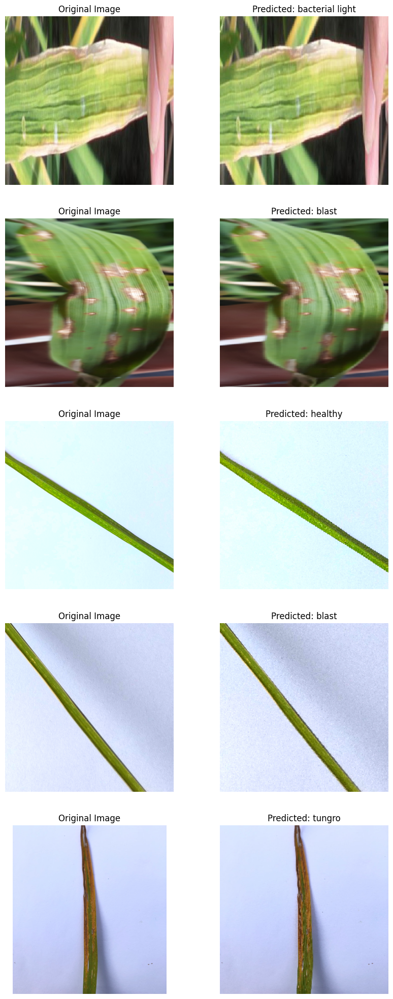

In [ ]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model

# Load the model
model_path = '/content/drive/MyDrive/Dataset/densenet121_rice_disease.h5'
model = load_model(model_path)

# Define class labels (based on your training data)
class_labels = ['bacterial light', 'blast', 'brown spot', 'healthy', 'hispa', 'tungro']

# Function to preprocess and predict
def predict_disease(image_paths):
    num_images = len(image_paths)
    plt.figure(figsize=(10, 5 * num_images))

    for idx, image_path in enumerate(image_paths):
        img = image.load_img(image_path, target_size=(224, 224))  # Resize to model input size
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        img_array = img_array / 255.0  # Normalize the image

        # Prediction
        predictions = model.predict(img_array)
        predicted_class = class_labels[np.argmax(predictions)]
        predicted_prob = np.max(predictions)

        print(f"Predicted Disease for {image_path}: {predicted_class} with probability {predicted_prob:.4f}")

        # Plot the original image and the prediction
        plt.subplot(num_images, 2, 2 * idx + 1)
        plt.imshow(image.load_img(image_path))
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(num_images, 2, 2 * idx + 2)
        plt.imshow(img)
        plt.title(f"Predicted: {predicted_class}")
        plt.axis('off')

    plt.show()

# Test the prediction with multiple sample images
image_paths = [
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/bacterial light/BACTERAILBLIGHT3_030.jpg',  # Update with your test image paths
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/blast/BLAST1_024.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/healthy/IMG_20190419_095442.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/hispa/IMG_20190419_103430.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/tungro/IMG_0887.jpg'
]
predict_disease(image_paths)

1/1 ━━━━━━━━━━━━━━━━━━━━ 9s 9s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━

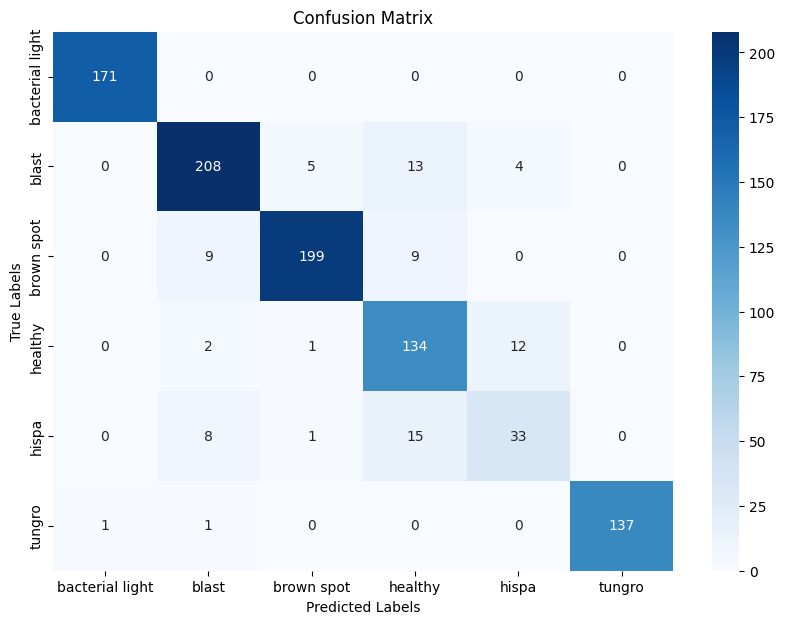

Classification Report:
                  precision    recall  f1-score   support

bacterial light       0.99      1.00      1.00       171
          blast       0.91      0.90      0.91       230
     brown spot       0.97      0.92      0.94       217
        healthy       0.78      0.90      0.84       149
          hispa       0.67      0.58      0.62        57
         tungro       1.00      0.99      0.99       139

       accuracy                           0.92       963
      macro avg       0.89      0.88      0.88       963
   weighted avg       0.92      0.92      0.92       963



In [ ]:
import tensorflow as tf
import numpy as np
import os
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Load the model
model_path = '/content/drive/MyDrive/Dataset/densenet121_rice_disease.h5'
model = tf.keras.models.load_model(model_path)

# Define class labels (based on your training data)
class_labels = ['bacterial light', 'blast', 'brown spot', 'healthy', 'hispa', 'tungro']

# Function to preprocess and predict
def predict_labels(test_dir):
    true_labels = []
    predicted_labels = []

    for class_label in class_labels:
        class_dir = os.path.join(test_dir, class_label)
        if not os.path.exists(class_dir):
            print(f"Directory for class '{class_label}' not found. Skipping.")
            continue

        # Iterate through each image in the class directory
        for img_name in os.listdir(class_dir):
            img_path = os.path.join(class_dir, img_name)
            img = image.load_img(img_path, target_size=(224, 224))
            img_array = image.img_to_array(img)
            img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize

            # Predict
            predictions = model.predict(img_array)
            predicted_class = np.argmax(predictions)

            # Append true and predicted labels
            true_labels.append(class_labels.index(class_label))
            predicted_labels.append(predicted_class)

    return np.array(true_labels), np.array(predicted_labels)

# Generate true and predicted labels
test_dir = '/content/drive/MyDrive/Dataset/dataset_RTI/test'  # Update with your test directory
true_labels, predicted_labels = predict_labels(test_dir)

# Generate confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', xticklabels=class_labels, yticklabels=class_labels, cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# Print classification report
report = classification_report(true_labels, predicted_labels, target_names=class_labels)
print("Classification Report:\n", report)


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/bacterial light/BACTERAILBLIGHT3_024.jpg: bacterial blight with probability 0.9999
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/blast/BLAST1_024.jpg: blast with probability 1.0000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/healthy/IMG_20190419_095442.jpg: healthy with probability 0.8004
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 263ms/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/hispa/IMG_20190419_103430.jpg: blast with probability 0.9254
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
Predicted Disease for /content/drive/MyDrive/Dataset/dataset_RTI/test/tungro/IMG_0887.jpg: tungro with probability 1.0000


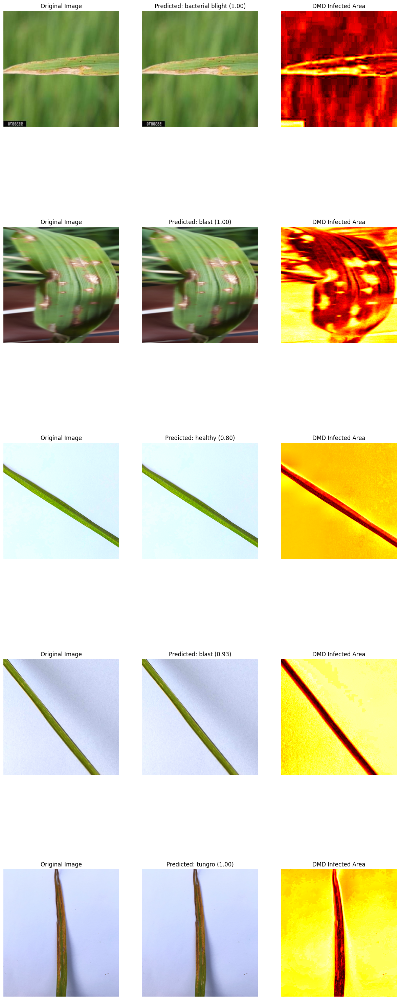

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from skimage import exposure

# Load the trained model
model_path = '/content/drive/MyDrive/Dataset/densenet121_rice_disease.h5'  # Update with your model path
model = load_model(model_path)

# Define class labels (based on your training data)
class_labels = ['bacterial blight', 'blast', 'brown spot', 'healthy', 'hispa', 'tungro']

# DMD-based function to highlight disease areas
def apply_dmd(snapshot_matrix):
    reshaped_matrix = snapshot_matrix.reshape(-1, snapshot_matrix.shape[-1]).T
    U, Sigma, VT = np.linalg.svd(reshaped_matrix, full_matrices=False)
    low_rank = np.dot(U[:, :1], np.dot(np.diag(Sigma[:1]), VT[:1, :]))
    sparse = reshaped_matrix - low_rank
    sparse_normalized = cv2.normalize(sparse[0], None, 0, 1, cv2.NORM_MINMAX)  # Normalize to [0, 1]
    return sparse_normalized.reshape(snapshot_matrix.shape[:2])

def preprocess_and_highlight_infection(img_array):
    # Convert to color spaces
    lab = cv2.cvtColor(img_array, cv2.COLOR_RGB2LAB)
    ycbcr = cv2.cvtColor(img_array, cv2.COLOR_RGB2YCrCb)

    # Create snapshot matrix
    snapshot_matrix = np.stack([lab[..., 1], lab[..., 2], ycbcr[..., 1]], axis=-1)

    # Apply DMD to get the sparse component
    sparse_component = apply_dmd(snapshot_matrix)

    # Enhance for visibility
    sparse_enhanced = exposure.equalize_adapthist(sparse_component)  # Output in [0, 1]
    sparse_enhanced = (sparse_enhanced * 255).astype(np.uint8)       # Rescale to [0, 255]

    return sparse_enhanced

# Function to predict disease and apply DMD on the same images
def predict_and_apply_dmd(image_paths):
    num_images = len(image_paths)
    plt.figure(figsize=(15, 8 * num_images))

    for idx, image_path in enumerate(image_paths):
        # Load and preprocess the image for model prediction
        original_image = image.load_img(image_path)
        img_array = np.array(original_image)
        img_resized = cv2.resize(img_array, (224, 224))
        img_resized = img_resized / 255.0
        img_resized = np.expand_dims(img_resized, axis=0)

        # Prediction
        predictions = model.predict(img_resized)
        predicted_class = class_labels[np.argmax(predictions)]
        predicted_prob = np.max(predictions)

        print(f"Predicted Disease for {image_path}: {predicted_class} with probability {predicted_prob:.4f}")

        # Apply DMD to the original image to highlight the infected area
        infected_area = preprocess_and_highlight_infection(img_array)

        # Plot original image, predicted result, and DMD-processed image side by side
        plt.subplot(num_images, 3, 3 * idx + 1)
        plt.imshow(img_array)
        plt.title("Original Image")
        plt.axis('off')

        plt.subplot(num_images, 3, 3 * idx + 2)
        plt.imshow(img_array)
        plt.title(f"Predicted: {predicted_class} ({predicted_prob:.2f})")
        plt.axis('off')

        plt.subplot(num_images, 3, 3 * idx + 3)
        plt.imshow(infected_area, cmap='hot')
        plt.title("DMD Infected Area")
        plt.axis('off')

    plt.show()

# Sample image paths for testing
image_paths = [
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/bacterial light/BACTERAILBLIGHT3_024.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/blast/BLAST1_024.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/healthy/IMG_20190419_095442.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/hispa/IMG_20190419_103430.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/tungro/IMG_0887.jpg'
]

# Run prediction and infected area visualization with DMD
predict_and_apply_dmd(image_paths)


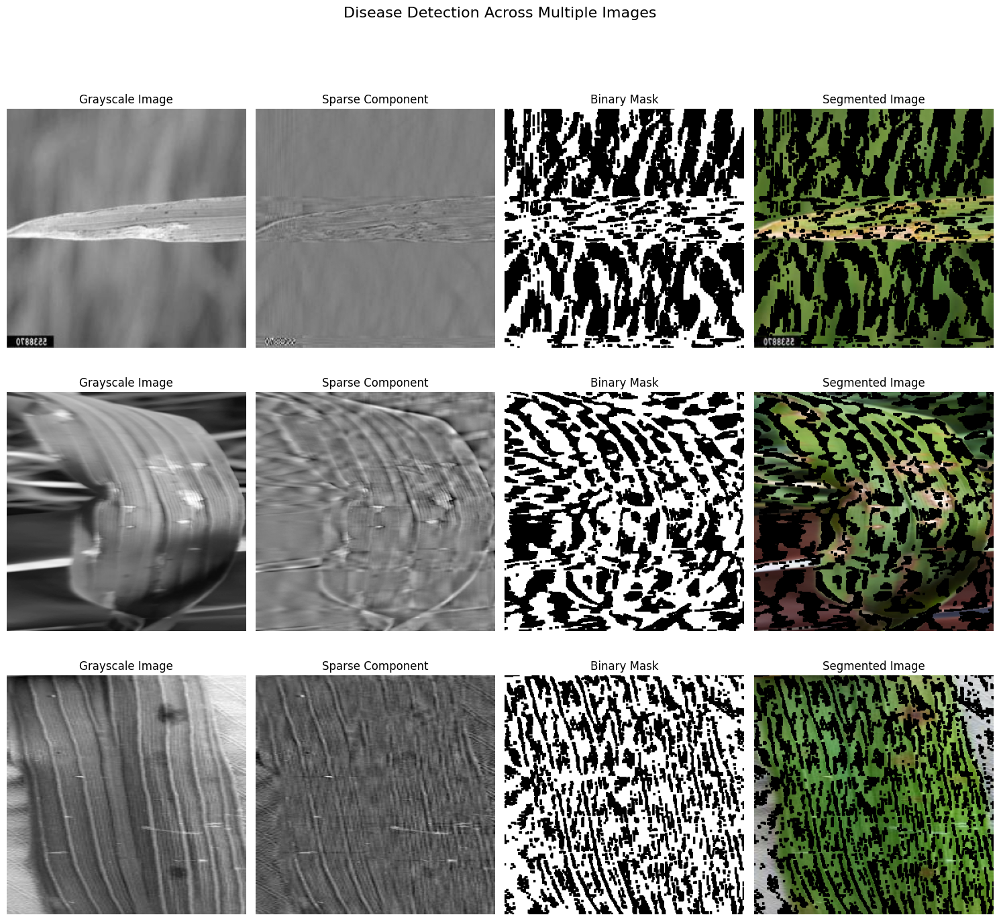

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import svd

def process_image(image_path):
    """
    Process a single image to extract diseased regions using SVD.
    """
    # Load the original image
    image = cv2.imread(image_path)
    # Convert the image to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Reshape the image into a matrix form for SVD
    image_matrix = gray_image.reshape(-1, gray_image.shape[1])

    # Apply SVD
    U, Sigma, VT = svd(image_matrix, full_matrices=False)

    # Reconstruct the image with dominant components for low-rank approximation
    rank = 10  # Number of components to keep
    low_rank = np.dot(U[:, :rank], np.dot(np.diag(Sigma[:rank]), VT[:rank, :]))

    # Obtain sparse component by subtracting low-rank from original matrix
    sparse_component = image_matrix - low_rank
    sparse_image = sparse_component.reshape(gray_image.shape)

    # Apply thresholding to isolate diseased spots
    _, binary_mask = cv2.threshold(sparse_image.astype(np.uint8), 30, 255, cv2.THRESH_BINARY)

    # Perform morphological operations to clean up the mask
    kernel = np.ones((3, 3), np.uint8)
    cleaned_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Convert mask to 3 channels for overlay
    mask_3channel = cv2.merge([cleaned_mask, cleaned_mask, cleaned_mask])
    segmented_image = cv2.bitwise_and(image, mask_3channel)

    return gray_image, sparse_image, cleaned_mask, segmented_image

# Paths for multiple images
image_paths = [
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/bacterial light/BACTERAILBLIGHT3_024.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/blast/BLAST1_024.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/brown spot/BROWNSPOT1_024.jpg'
]

# Number of images
num_images = len(image_paths)

# Prepare the subplot grid
fig, axs = plt.subplots(num_images, 4, figsize=(15, num_images * 5))
fig.suptitle("Disease Detection Across Multiple Images", fontsize=16)

# Process and display each image
for i, image_path in enumerate(image_paths):
    gray_image, sparse_image, cleaned_mask, segmented_image = process_image(image_path)

    # Display each step in the corresponding subplot
    axs[i, 0].imshow(gray_image, cmap='gray')
    axs[i, 0].set_title("Grayscale Image")
    axs[i, 0].axis('off')

    axs[i, 1].imshow(sparse_image, cmap='gray')
    axs[i, 1].set_title("Sparse Component")
    axs[i, 1].axis('off')

    axs[i, 2].imshow(cleaned_mask, cmap='gray')
    axs[i, 2].set_title("Binary Mask")
    axs[i, 2].axis('off')

    axs[i, 3].imshow(cv2.cvtColor(segmented_image, cv2.COLOR_BGR2RGB))
    axs[i, 3].set_title("Segmented Image")
    axs[i, 3].axis('off')

# Adjust layout and display
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


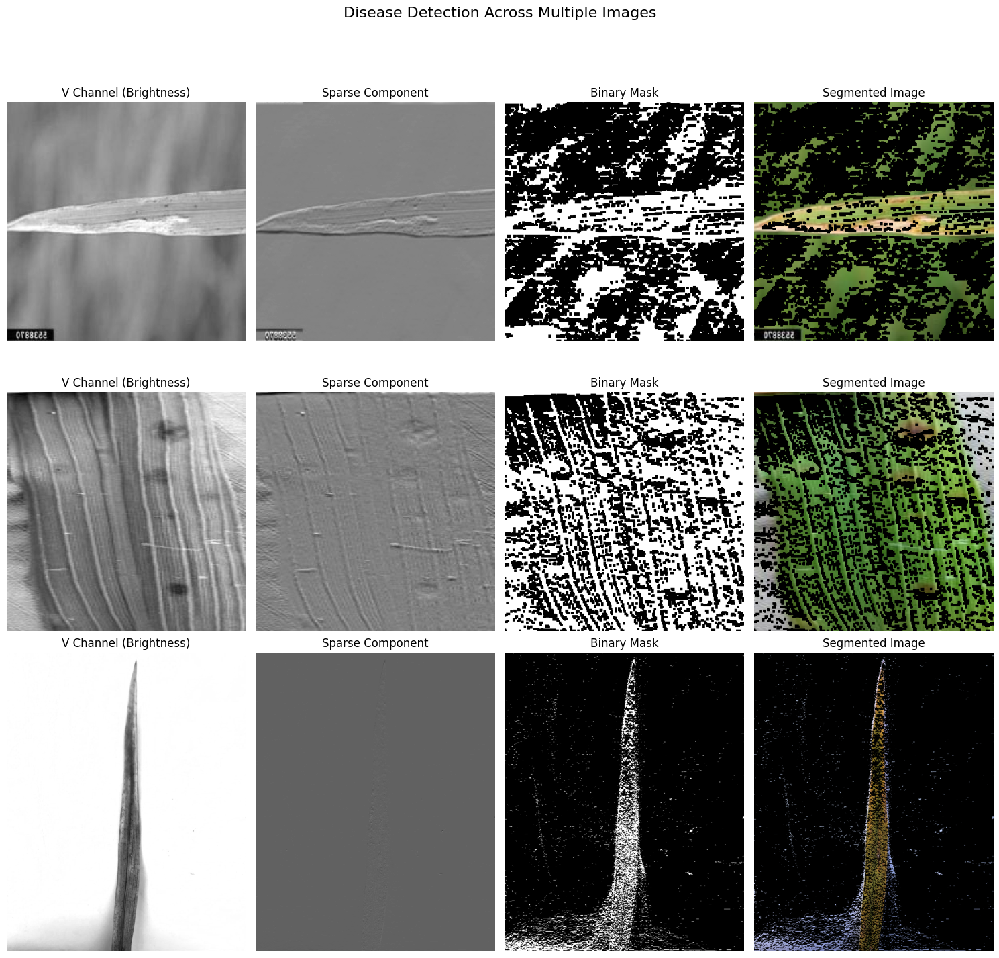

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.linalg import svd

def process_image(image_path):
    """
    Processes a single image to highlight diseased regions using SVD and segmentation.
    """
    # Load and prepare the image
    image = cv2.imread(image_path)
    if image is None:
        print(f"Error: Unable to load image at {image_path}. Please check the path.")
        return None, None, None, None  # Return None if the image can't be loaded

    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for consistency in plotting

    # Step 1: Convert to HSV and use the V channel for better contrast
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    v_channel = hsv_image[:, :, 2]

    # Step 2: Generate snapshot matrix by creating transformations of the V channel
    snapshots = []
    for shift in range(5):  # Creating 5 slightly shifted frames
        shifted_image = np.roll(v_channel, shift, axis=0)
        snapshots.append(shifted_image.flatten())

    # Stack snapshots as columns in a matrix
    snapshot_matrix = np.array(snapshots).T

    # Step 3: Apply SVD on the snapshot matrix
    U, Sigma, VT = svd(snapshot_matrix, full_matrices=False)
    rank = 1  # Choosing rank-1 for low-rank approximation
    low_rank = np.dot(U[:, :rank], np.dot(np.diag(Sigma[:rank]), VT[:rank, :]))

    # Calculate sparse component by subtracting low-rank approximation
    sparse_component = snapshot_matrix - low_rank
    sparse_image = sparse_component[:, 0].reshape(v_channel.shape)

    # Step 4: Threshold the sparse component to create a binary mask
    _, binary_mask = cv2.threshold(sparse_image.astype(np.uint8), 20, 255, cv2.THRESH_BINARY)

    # Step 5: Apply morphological operations to refine the mask
    kernel = np.ones((3, 3), np.uint8)
    cleaned_mask = cv2.morphologyEx(binary_mask, cv2.MORPH_CLOSE, kernel)

    # Step 6: Convert mask to 3 channels for overlay
    mask_3channel = cv2.merge([cleaned_mask, cleaned_mask, cleaned_mask])

    # Step 7: Apply the mask to the original image to isolate diseased areas
    segmented_image = cv2.bitwise_and(image, mask_3channel)

    return v_channel, sparse_image, cleaned_mask, segmented_image

# List of image paths for processing multiple images
image_paths = [
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/bacterial light/BACTERAILBLIGHT3_024.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/brown spot/BROWNSPOT1_024.jpg',
    '/content/drive/MyDrive/Dataset/dataset_RTI/test/tungro/IMG_0844.jpg'
]

# Number of images to display in the subplot grid
num_images = len(image_paths)

# Prepare the subplot grid for displaying results side-by-side
fig, axs = plt.subplots(num_images, 4, figsize=(15, num_images * 5))
fig.suptitle("Disease Detection Across Multiple Images", fontsize=16)

# Process and display each image
for i, image_path in enumerate(image_paths):
    v_channel, sparse_image, cleaned_mask, segmented_image = process_image(image_path)

    # Only display if the image was processed successfully
    if v_channel is not None:
        axs[i, 0].imshow(v_channel, cmap='gray')
        axs[i, 0].set_title("V Channel (Brightness)")
        axs[i, 0].axis('off')

        axs[i, 1].imshow(sparse_image, cmap='gray')
        axs[i, 1].set_title("Sparse Component")
        axs[i, 1].axis('off')

        axs[i, 2].imshow(cleaned_mask, cmap='gray')
        axs[i, 2].set_title("Binary Mask")
        axs[i, 2].axis('off')

        axs[i, 3].imshow(segmented_image)
        axs[i, 3].set_title("Segmented Image")
        axs[i, 3].axis('off')
    else:
        # If the image couldn't be loaded, display an error message
        axs[i, 0].text(0.5, 0.5, "Image not found", ha='center', va='center')
        for j in range(4):
            axs[i, j].axis('off')

# Adjust layout and display the results
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set up the test data generator
test_data_dir = '/content/drive/MyDrive/Dataset/dataset_RTI/test'  # Replace with your test data directory
batch_size = 32  # Adjust as needed

# Create a test data generator without data augmentation
test_datagen = ImageDataGenerator(rescale=1.0 / 255)  # Scaling the pixel values if needed
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(224, 224),  # Replace with the input size of your DenseNet model
    batch_size=batch_size,
    class_mode='categorical',  # Use 'binary' if it's binary classification
    shuffle=False  # Important for evaluating with a confusion matrix
)

# Now proceed with model evaluation and metrics as before
test_loss, test_accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate predictions on the test set
y_pred = model.predict(test_generator, verbose=1)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

# Get class labels
class_labels = list(test_generator.class_indices.keys())

# Classification report
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print("Classification Report:")
print(report)

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


Found 963 images belonging to 6 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


31/31 ━━━━━━━━━━━━━━━━━━━━ 285s 9s/step - accuracy: 0.9527 - loss: 0.1184
Test Accuracy: 91.59%
31/31 ━━━━━━━━━━━━━━━━━━━━ 171s 5s/step


NameError: name 'classification_report' is not defined

Found 963 images belonging to 6 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


31/31 ━━━━━━━━━━━━━━━━━━━━ 172s 5s/step - accuracy: 0.9527 - loss: 0.1184
Test Accuracy: 91.59%
31/31 ━━━━━━━━━━━━━━━━━━━━ 171s 5s/step
Classification Report:
                 precision    recall  f1-score   support

bacterial light       0.99      1.00      1.00       171
          blast       0.91      0.90      0.91       230
     brown spot       0.97      0.92      0.94       217
        healthy       0.78      0.90      0.84       149
          hispa       0.67      0.58      0.62        57
         tungro       1.00      0.99      0.99       139

       accuracy                           0.92       963
      macro avg       0.89      0.88      0.88       963
   weighted avg       0.92      0.92      0.92       963



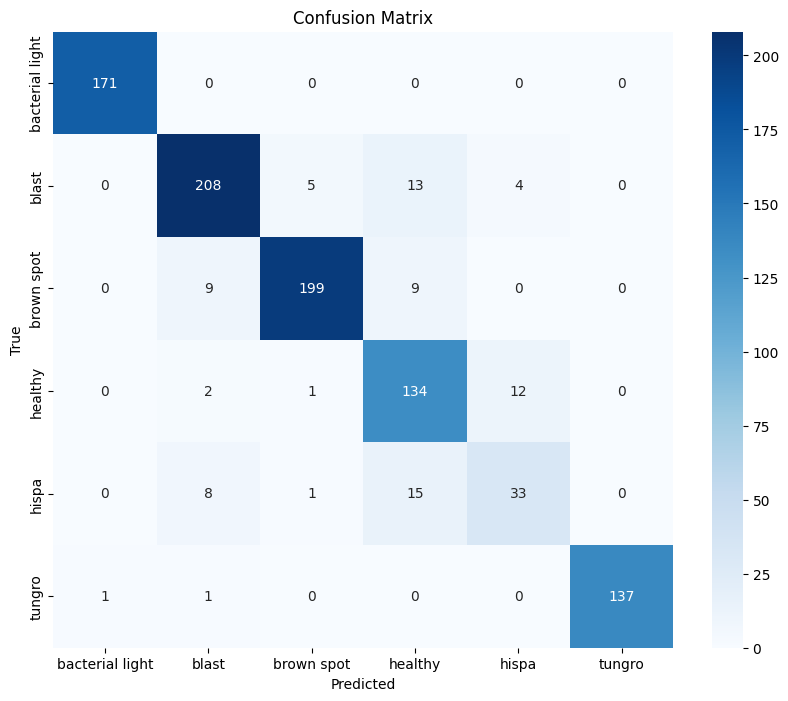

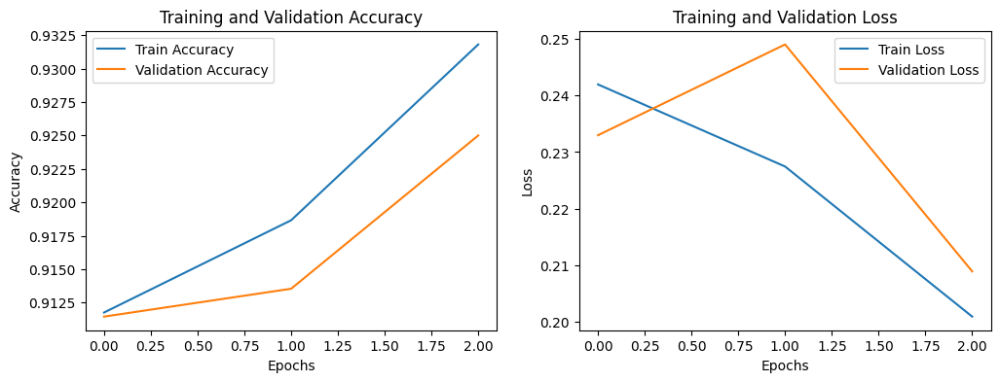

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Load the pre-trained DenseNet model
model_path = '/content/drive/MyDrive/Dataset/densenet121_rice_disease.h5'  # Update with your model path
model = load_model(model_path)

# Set up the test data generator
test_data_dir = '/content/drive/MyDrive/Dataset/dataset_RTI/test'  # Update with your test data directory
batch_size = 32  # Adjust as needed

# Create a test data generator without data augmentation
test_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(224, 224),  # Update according to DenseNet input size (e.g., 224x224)
    batch_size=batch_size,
    class_mode='categorical',  # Use 'binary' if it's a binary classification problem
    shuffle=False
)

# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_generator)
print(f'Test Accuracy: {test_accuracy * 100:.2f}%')

# Generate predictions on the test set
y_pred = model.predict(test_generator, verbose=1)
y_pred_classes = np.argmax(y_pred, axis=1)  # Convert probabilities to class labels
y_true = test_generator.classes  # Actual labels

# Get class labels
class_labels = list(test_generator.class_indices.keys())

# Classification report
report = classification_report(y_true, y_pred_classes, target_names=class_labels)
print("Classification Report:")
print(report)

# Confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Plot training history if available (accuracy and loss)
# Ensure 'history' variable is available from training phase if saved.
# Uncomment the below code if you have access to 'history' after training

# Example:
# history = model.fit(...)  # During model training, you would store this as `history`.

# Plot training & validation accuracy values
try:
    plt.figure(figsize=(12, 4))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.title('Training and Validation Accuracy')

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training and Validation Loss')

    plt.show()

except NameError:
    print("Training history is not available. Ensure 'history' is saved from the training phase.")


In [ ]:
import cv2
import numpy as np

def convert_to_color_spaces(image):
    """
    Convert the input image to various color spaces and return selected channels.
    """
    if image is None:
        raise ValueError("The input image is None. Please check the image path and ensure the image is loaded correctly.")

    # Convert to LAB color space and extract the L*, a*, and b* channels
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)
    l_channel, a_channel, b_channel = cv2.split(lab)

    # Convert to YCbCr color space and extract the Y, Cb, and Cr channels
    ycbcr = cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)
    y_channel, cb_channel, cr_channel = cv2.split(ycbcr)

    # Convert to HSV color space and extract the H, S, and V channels
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    h_channel, s_channel, v_channel = cv2.split(hsv)

    # Stack selected channels into a snapshot matrix for DMD
    snapshot_matrix = np.stack([l_channel, a_channel, b_channel, y_channel, cr_channel, v_channel], axis=-1)

    return snapshot_matrix

In [ ]:
!pip install pydmd

In [ ]:
from pydmd import DMD

def apply_dmd_on_snapshot(snapshot_matrix, rank=2):
    """
    Apply DMD on the snapshot matrix and return the sparse component.
    """
    # Reshape the snapshot matrix to 2D
    X = snapshot_matrix.reshape(-1, snapshot_matrix.shape[-1])

    # Apply DMD
    dmd = DMD(svd_rank=rank)
    dmd.fit(X)

    # Reconstruct the image using DMD modes
    reconstructed_data = dmd.reconstructed_data.real

    # Extract the sparse component (difference between original and reconstructed data)
    sparse_component = np.abs(X - reconstructed_data)

    # Reshape the sparse component back to the original image shape
    sparse_component = sparse_component.reshape(snapshot_matrix.shape)

    return sparse_component

In [ ]:
def generate_attention_map(sparse_component):
    """
    Generate an attention map from the sparse component.
    """
    # Sum the sparse component across the channels to get the attention map
    attention_map = np.sum(sparse_component, axis=-1)

    # Normalize the attention map to range [0, 255]
    attention_map = cv2.normalize(attention_map, None, 0, 255, cv2.NORM_MINMAX)

    return attention_map

In [ ]:
import os

def process_and_save_images(dataset_path, output_path, rank=2):
    """
    Apply DMD to each image in the dataset and save the processed images.
    """
    if not os.path.exists(output_path):
        os.makedirs(output_path)

    for root, dirs, files in os.walk(dataset_path):
        for file in files:
            if file.endswith(('.png', '.jpg', '.jpeg')):
                image_path = os.path.join(root, file)
                image = cv2.imread(image_path)

                if image is not None:
                    # Convert to different color spaces and get the snapshot matrix
                    snapshot_matrix = convert_to_color_spaces(image)

                    # Apply DMD on the snapshot matrix
                    sparse_component = apply_dmd_on_snapshot(snapshot_matrix, rank)

                    # Generate the attention map
                    attention_map = generate_attention_map(sparse_component)

                    # Save the attention map as an image
                    output_image_path = os.path.join(output_path, file)
                    cv2.imwrite(output_image_path, attention_map)
                else:
                    print(f"Warning: {image_path} is not a valid image.")

# Example usage
dataset_path = '/content/drive/MyDrive/dataset_RTI'
output_path = '/content/drive/MyDrive/dataset_RTI/DMD_IMAGES'

# Process and save the images
process_and_save_images(dataset_path, output_path)

Streaming output truncated to the last 5000 lines.
matrix, or regularization methods.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 1.5796275379178025e+30. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 4.953731603819591e+30. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 3.135016452320161e+31. Consider preprocessing data, passing in augmented data
matrix, or regularization methods.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/pydmd/snapshots.py:73: UserWarning: Input data condition number 1.916033140732582e+31. Consider preprocessing data, passing in augmented data
matrix, or r

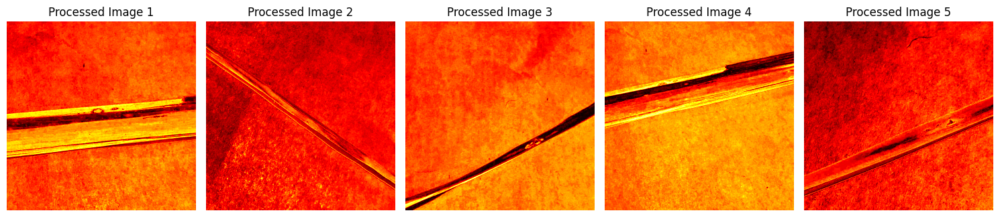

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt

def visualize_dmd_processed_images(dataset_path, num_images=5):
    """
    Visualize a few DMD-processed images to confirm that the diseased areas are correctly highlighted.
    """
    processed_images = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith(('.png', '.jpg', '.jpeg'))]

    plt.figure(figsize=(15, 10))
    for i, image_path in enumerate(processed_images[:num_images]):
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        plt.subplot(1, num_images, i+1)
        plt.imshow(image, cmap='hot')
        plt.title(f'Processed Image {i+1}')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

# Visualize a few DMD-processed images
visualize_dmd_processed_images('/content/drive/MyDrive/dataset_RTI/DMD_IMAGES')

In [ ]:
import os

def count_images_in_directory(directory, extensions=['.png', '.jpg', '.jpeg']):
    """
    Count the number of images in a directory with specified extensions.

    Args:
    directory (str): Path to the directory.
    extensions (list): List of file extensions to consider as images.

    Returns:
    int: Number of images in the directory.
    """
    if not os.path.exists(directory):
        raise FileNotFoundError(f"Directory not found: {directory}")

    image_count = 0
    for file in os.listdir(directory):
        if any(file.lower().endswith(ext) for ext in extensions):
            image_count += 1

    return image_count

# Define the directory path
directory_path = '/content/drive/MyDrive/dataset_RTI/DMD_IMAGES'

# Count the number of images in the directory
num_images = count_images_in_directory(directory_path)

print(f"Number of DMD-processed images in the directory '{directory_path}': {num_images}")

Number of DMD-processed images in the directory '/content/drive/MyDrive/dataset_RTI/DMD_IMAGES': 7913


In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from imgaug import augmenters as iaa

def preprocess_image(image, target_size=(224, 224)):
    """
    Resize and normalize the image.
    """
    # Resize image
    image_resized = cv2.resize(image, target_size)

    # Normalize image to [0, 1] range
    image_normalized = image_resized / 255.0

    return image_normalized

def augment_image(image):
    """
    Apply data augmentation techniques to the image.
    """
    seq = iaa.Sequential([
        iaa.Fliplr(0.5),  # horizontal flips
        iaa.Affine(rotate=(-20, 20)),  # random rotations
        iaa.Multiply((0.8, 1.2)),  # change brightness
        iaa.Affine(scale=(0.8, 1.2))  # zoom in/out
    ])

    image_augmented = seq(image=image)

    return image_augmented

def preprocess_and_augment_images(dataset_path, target_size=(224, 224), num_images=5):
    """
    Preprocess and augment a few DMD-processed images.
    """
    processed_images = [os.path.join(dataset_path, f) for f in os.listdir(dataset_path) if f.endswith(('.png', '.jpg', '.jpeg'))]

    plt.figure(figsize=(15, 10))
    for i, image_path in enumerate(processed_images[:num_images]):
        image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

        if image is None:
            print(f"Error: Unable to load image at {image_path}")
            continue

        # Preprocess image
        image_preprocessed = preprocess_image(image, target_size)

        # Augment image
        image_augmented = augment_image(image_preprocessed)

        plt.subplot(2, num_images, i+1)
        plt.imshow(image_preprocessed, cmap='gray')
        plt.title(f'Preprocessed Image {i+1}')
        plt.axis('off')

        plt.subplot(2, num_images, num_images+i+1)
        plt.imshow(image_augmented, cmap='gray')
        plt.title(f'Augmented Image {i+1}')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# Preprocess and augment a few DMD-processed images
preprocess_and_augment_images('/content/drive/MyDrive/dataset_RTI')

<Figure size 1500x1000 with 0 Axes>

In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121, Xception
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.models import Model

In [ ]:
def create_model(base_model, num_classes):
    """
    Create a custom model using the pre-trained base model.
    """
    # Add global average pooling layer
    x = base_model.output
    x = GlobalAveragePooling2D()(x)

    # Add a fully connected layer
    x = Dense(1024, activation='relu')(x)

    # Add a dropout layer
    x = Dropout(0.5)(x)

    # Add the output layer
    predictions = Dense(num_classes, activation='softmax')(x)

    # Create the model
    model = Model(inputs=base_model.input, outputs=predictions)

    return model

In [ ]:
# Number of classes in the disease detection problem
num_classes = 6

# Load DenseNet121 with ImageNet weights
base_model_densenet = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
model_densenet = create_model(base_model_densenet, num_classes)

# Load XceptionNet with ImageNet weights
base_model_xception = Xception(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
model_xception = create_model(base_model_xception, num_classes)

In [ ]:
# Compile DenseNet121 model
model_densenet.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Compile XceptionNet model
model_xception.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
# Print summary of DenseNet121 model
model_densenet.summary()

# Print summary of XceptionNet model
model_xception.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_2          │ (None, 230, 230, 3)    │              0 │ input_layer_2[0][0]    │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_conv (Conv2D)       │ (None, 112, 112, 64)   │          9,408 │ zero_padding2d_2[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_bn                  │ (None, 112, 112, 64)   │            256 │ conv1_conv[0][0]       │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv1_relu (Activation)   │ (None, 112, 112, 64)   │              0 │ conv1_bn[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ zero_padding2d_3          │ (None, 114, 114, 64)   │              0 │ conv1_relu[0][0]       │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pool1 (MaxPooling2D)      │ (None, 56, 56, 64)     │              0 │ zero_padding2d_3[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_bn         │ (None, 56, 56, 64)     │            256 │ pool1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_0_relu       │ (None, 56, 56, 64)     │              0 │ conv2_block1_0_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_conv       │ (None, 56, 56, 128)    │          8,192 │ conv2_block1_0_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_bn         │ (None, 56, 56, 128)    │            512 │ conv2_block1_1_conv[0… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_1_relu       │ (None, 56, 56, 128)    │              0 │ conv2_block1_1_bn[0][… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_2_conv       │ (None, 56, 56, 32)     │         36,864 │ conv2_block1_1_relu[0… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2_block1_concat       │ (None, 56, 56, 96)     │              0 │ pool1[0][0],           │
│ (Concatenate)             │                        │                │ conv2_block1_2_conv[0… │
├──────────────────────

 Total params: 8,093,254 (30.87 MB)

 Trainable params: 8,009,606 (30.55 MB)

 Non-trainable params: 83,648 (326.75 KB)

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1 (Conv2D)     │ (None, 111, 111, 32)   │            864 │ input_layer_3[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_bn           │ (None, 111, 111, 32)   │            128 │ block1_conv1[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv1_act          │ (None, 111, 111, 32)   │              0 │ block1_conv1_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2 (Conv2D)     │ (None, 109, 109, 64)   │         18,432 │ block1_conv1_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_bn           │ (None, 109, 109, 64)   │            256 │ block1_conv2[0][0]     │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1_conv2_act          │ (None, 109, 109, 64)   │              0 │ block1_conv2_bn[0][0]  │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1           │ (None, 109, 109, 128)  │          8,768 │ block1_conv2_act[0][0] │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv1_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv1[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_act       │ (None, 109, 109, 128)  │              0 │ block2_sepconv1_bn[0]… │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2           │ (None, 109, 109, 128)  │         17,536 │ block2_sepconv2_act[0… │
│ (SeparableConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_sepconv2_bn        │ (None, 109, 109, 128)  │            512 │ block2_sepconv2[0][0]  │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 55, 55, 128)    │          8,192 │ block1_conv2_act[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block2_pool               │ (None, 55, 55, 128)    │              0 │ block2_sepconv2_bn[0]… │
│ (MaxPooling2D)            │                        │                │                        │
├──────────────────────

 Total params: 22,965,806 (87.61 MB)

 Trainable params: 22,911,278 (87.40 MB)

 Non-trainable params: 54,528 (213.00 KB)

In [ ]:
!pip install tensorflow

In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

In [ ]:
import os

# Define paths
base_dir = '/content/drive/MyDrive/dataset_RTI'
train_data_dir = os.path.join(base_dir, 'train')
validation_data_dir = os.path.join(base_dir, 'validation')

# Create directories if they do not exist
os.makedirs(train_data_dir, exist_ok=True)
os.makedirs(validation_data_dir, exist_ok=True)

# Create subdirectories for each class
classes = ['class1', 'class2', 'class3']
for class_name in classes:
    os.makedirs(os.path.join(train_data_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(validation_data_dir, class_name), exist_ok=True)

print("Directories created successfully.")

Directories created successfully.


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

# Define paths
train_data_dir = '/content/drive/MyDrive/dataset_RTI/train'
validation_data_dir = '/content/drive/MyDrive/dataset_RTI/validation'

# Image data generators for training and validation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

validation_datagen = ImageDataGenerator(rescale=1./255)

# Data generators
train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

validation_generator = validation_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

# Compile the Model
def compile_model(model):
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return model

# Compile DenseNet121 model
model_densenet = compile_model(model_densenet)

# Compile XceptionNet model
model_xception = compile_model(model_xception)

# Set Up Training Parameters and Callbacks
epochs = 50
batch_size = 32

# Callbacks
checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True, mode='min')
early_stopping = EarlyStopping(monitor='val_loss', patience=10, mode='min')

callbacks = [checkpoint, early_stopping]

# Train the Model
def train_model(model, train_generator, validation_generator, epochs, callbacks):
    history = model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // batch_size,
        validation_data=validation_generator,
        validation_steps=validation_generator.samples // batch_size,
        epochs=epochs,
        callbacks=callbacks
    )
    return history

# Train DenseNet121 model
history_densenet = train_model(model_densenet, train_generator, validation_generator, epochs, callbacks)

# Train XceptionNet model
history_xception = train_model(model_xception, train_generator, validation_generator, epochs, callbacks)

Found 0 images belonging to 3 classes.
Found 0 images belonging to 3 classes.


ValueError: The filepath provided must end in `.keras` (Keras model format). Received: filepath=best_model.h5

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from skimage.filters import threshold_otsu

# Step 1: Load and Resize Image
def load_and_resize_image(image_path, size=(256, 256)):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = cv2.resize(image, size)
    return image

# Step 2: Create Synthetic Time Snapshots
def create_synthetic_snapshots(image, num_snapshots=10):
    snapshots = [image + np.random.normal(0, 0.01, image.shape) for _ in range(num_snapshots)]
    return np.array(snapshots)

# Step 3: Apply DMD
def apply_dmd(snapshots):
    X = snapshots[:-1].reshape(snapshots.shape[0] - 1, -1).T
    X_prime = snapshots[1:].reshape(snapshots.shape[0] - 1, -1).T

    U, Sigma, Vh = np.linalg.svd(X, full_matrices=False)
    r = np.sum(Sigma > 1e-10)
    U_r = U[:, :r]
    Sigma_r = np.diag(Sigma[:r])
    V_r = Vh[:r, :]

    A_tilde = U_r.T @ X_prime @ V_r.T @ np.linalg.inv(Sigma_r)
    eigvals, eigvecs = np.linalg.eig(A_tilde)
    Phi = X_prime @ V_r.T @ np.linalg.inv(Sigma_r) @ eigvecs

    low_rank = (Phi @ np.diag(eigvals) @ np.linalg.pinv(Phi)).real
    sparse = X - low_rank

    return low_rank, sparse

# Step 4: Thresholding
def apply_thresholding(sparse_component):
    threshold = threshold_otsu(sparse_component)
    binary_mask = sparse_component > threshold
    return binary_mask

# Step 5: Visualization
def visualize_results(original_image, sparse_component, binary_mask):
    plt.figure(figsize=(12, 8))

    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_image, cmap='gray')

    plt.subplot(1, 3, 2)
    plt.title("Sparse Component")
    plt.imshow(sparse_component, cmap='gray')

    plt.subplot(1, 3, 3)
    plt.title("Binary Mask")
    plt.imshow(binary_mask, cmap='gray')

    plt.show()

# Main function to run the steps
def main(image_path):
    original_image = load_and_resize_image(image_path)
    snapshots = create_synthetic_snapshots(original_image)
    low_rank, sparse = apply_dmd(snapshots)
    binary_mask = apply_thresholding(sparse)
    visualize_results(original_image, sparse, binary_mask)

# Example usage
image_path = '/content/drive/MyDrive/DMD/rice data.PNG'  # Define your image path here
main(image_path)

Model Training with DMD